In [1]:
import pandas as pd
import numpy as np
import os
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import random
import operator

sns.set()

In [2]:
def get_networkx_from_df(df):
    
    nodes = set(df['userId'].drop_duplicates().tolist())
    df = df.groupby('productId').agg({'userId': list})
    l_uid = list(filter(lambda x:len(x)>1, list([item for t in zip(df['userId']) for item in t])))

    list_pairs = []
    for items in l_uid: list_pairs += [(items[i],items[j]) for i in range(len(items)) for j in range(i+1, len(items))]
    list_pairs = list(dict.fromkeys(list_pairs))
    
    edges = list_pairs   
    G = networkx.Graph()
    G.add_nodes_from(nodes)
    G.add_edges_from(edges)
    S = G.subgraph(max(nx.connected_components(G), key=len)).copy()
    return S

In [131]:
%%time
df = pd.read_csv('ratings_Movies_and_TV.csv', names = ['userId','productId','score','date'])
df.date = df.date.apply(lambda d: datetime.datetime.fromtimestamp(int(d)).strftime('%Y-%m-%d'))
df = df.sort_values(by = 'date')

Wall time: 46.9 s


In [132]:
df.shape

(4607047, 4)

In [134]:
df

,userId,productId,score,date
619756,A1R3P8MRFSN4X3,6301955250,4.0,1997-08-09
881112,A1HC72VDRLANIW,6303935419,1.0,1997-08-19
658688,A2XBTS97FERY2Q,6302049040,5.0,1997-08-23
914281,A3MIU1UTFCY3BK,6304174616,5.0,1997-09-03
730619,A3D50ZQNN9BEZF,630265288X,5.0,1997-09-12
...,...,...,...,...
4589983,A3HJH3TD30HRAC,B00HXEWG4E,5.0,2014-07-23
4598951,A3G5971VNK7ROC,B00J1Z3ZGG,3.0,2014-07-23
4604389,A4FX5YCJA630V,B00JPFTX5O,3.0,2014-07-23
4579673,A3HOEB9IN821XF,B00HI4EFO8,5.0,2014-07-23


In [135]:
df['userId'].value_counts()[:25000]{                }

A3LZGLA88K0LA0    2654
A16CZRQL23NOIW    2649
AV6QDP8Q0ONK4     2577
ABO2ZI2Y5DQ9T     2547
A2EDZH51XHFA9B    2497
                  ... 
A22232F96FKTN2      14
A3OIE7IE9LTPJG      14
AU503HFYAB0IG       14
A24H1WF3ADHRIG      14
A2FRAS05LEI6JJ      14
Name: userId, Length: 25000, dtype: int64

In [152]:
df_sample = df.loc[df['userId'].isin(df['userId'].value_counts()[:25000].index)].reset_index(drop = True)

In [153]:
df_sample['date'].max(), df_sample['date'].min()

('2014-07-23', '1998-01-03')

In [154]:
df_sample['date'] = pd.to_datetime(df_sample['date'])

In [156]:
df_sample['year'] = pd.DatetimeIndex(df_sample['date']).year

In [171]:
a = df_sample.groupby('year').count()['userId']

<AxesSubplot:xlabel='year'>

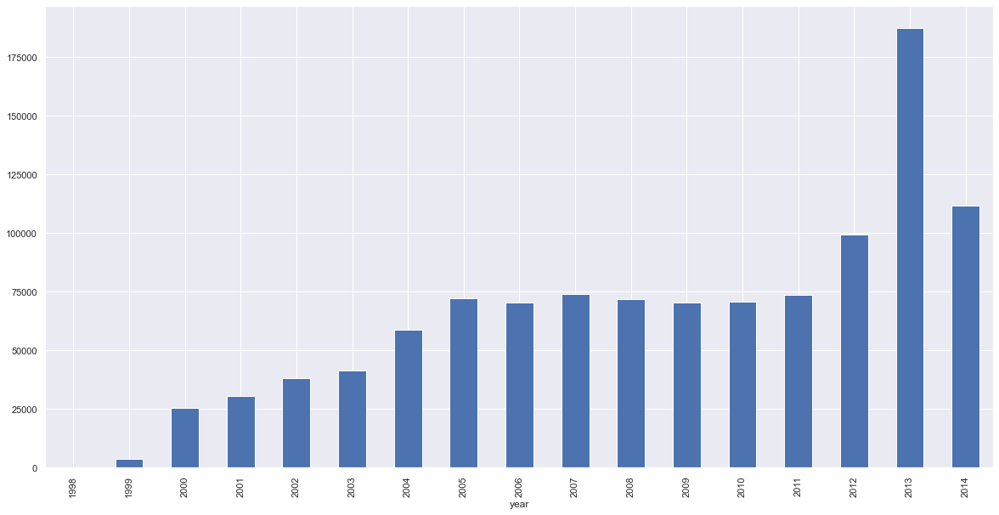

In [174]:
plt.figure (figsize=(20,10))
a.plot.bar()

In [16]:
%%time

data = '2008-06-01'

df_1 = df_sample.loc[df_sample['date']<=data].drop(['date', 'score'], axis = 1).reset_index(drop = True)
df_2 = df_sample.loc[(df_sample['date']>data)].drop(['date', 'score'], axis = 1).reset_index(drop = True)

df_1 = df_1.loc[df_1['userId'].isin(df_1['userId'])]
df_2 = df_2.loc[df_2['userId'].isin(df_2['userId'])]

Wall time: 1.67 s


In [17]:
%%time
G1 = get_networkx_from_df(df_1)

Wall time: 3min 3s


In [18]:
%%time
G2 = get_networkx_from_df(df_2)

Wall time: 5min 48s


In [130]:
print(nx.info(G1))

Name: 
Type: Graph
Number of nodes: 13498
Number of edges: 7146572
Average degree: 1058.9083


In [22]:
print(nx.info(G2))

Name: 
Type: Graph
Number of nodes: 21199
Number of edges: 13058296
Average degree: 1231.9728


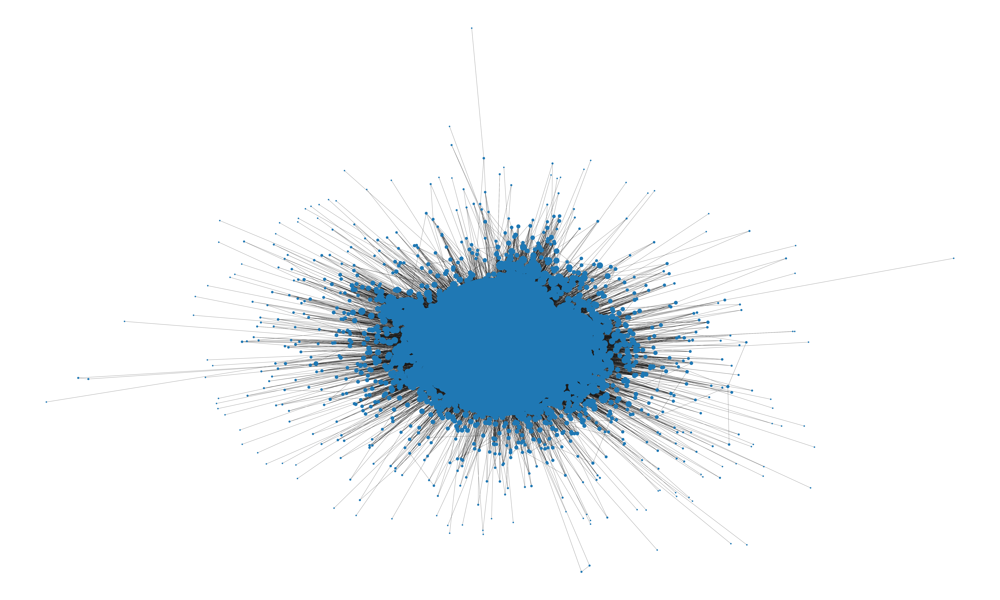

In [40]:
plt.figure(figsize=(100,60))
d = dict(G1.degree)
nx.draw(G1, nodelist=d.keys(), node_size=[v * 100 for v in d.values()])
plt.draw() 
plt.savefig('G1.png', bbox_inches='tight')

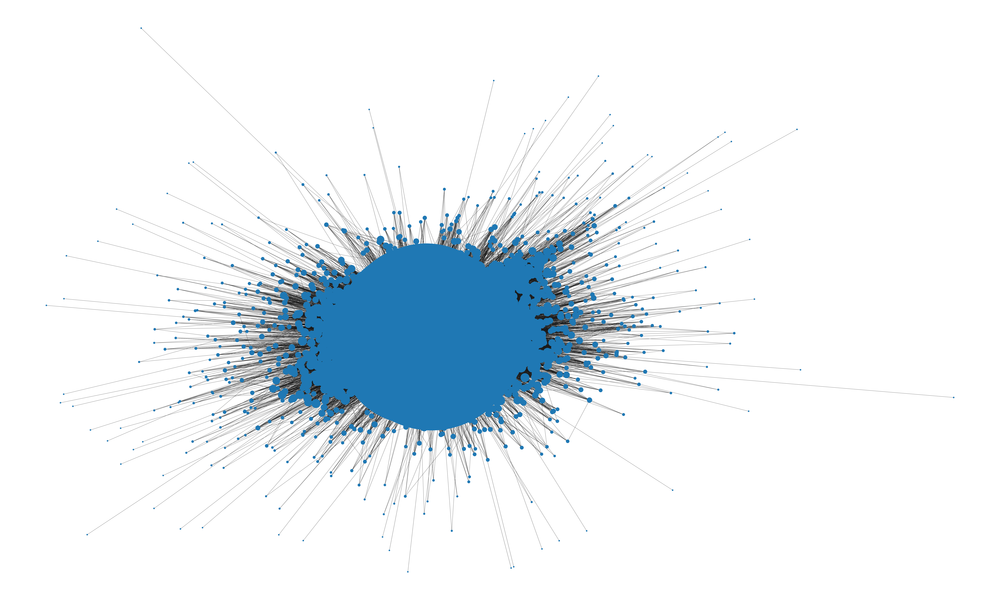

In [41]:
plt.figure(figsize=(100,60))
d = dict(G2.degree)
nx.draw(G2, nodelist=d.keys(), node_size=[v * 100 for v in d.values()])
plt.draw() 
plt.savefig('G2.png', bbox_inches='tight')

## Community

In [187]:
from networkx.algorithms.community import greedy_modularity_communities
from networkx.algorithms.community.asyn_fluid import asyn_fluidc

def score_similarity(group1, group2, total_sum = None):
    k =  0
    for item in group1:
        if item in list(group2):
            k += 1
    if total_sum is None:
        return k/len(group1)
    else:
        return k/len(group1)/(len(group2)/total_sum)

In [24]:
%%time
c1_greedy = list(greedy_modularity_communities(G1))
c2_greedy = list(greedy_modularity_communities(G2))

Wall time: 1h 49min 34s


In [27]:
len(c1_greedy), len(c2_greedy)

(10, 9)

In [28]:
%%time
c1_asyn = list(asyn_fluidc(G1, 3))
c2_asyn = list(asyn_fluidc(G2, 3))

Wall time: 44min 6s


In [29]:
len(c1_asyn), len(c2_asyn)

(3, 3)

In [34]:
networkx_container = {'g1': G1, 'g2': G2, 'c1_greedy': c1_greedy, 'c2_greedy': c2_greedy, 'c1_asyn': c1_asyn, 'c2_asyn': c2_asyn}

In [43]:
import pickle
with open('networkx_container.pkl', 'rb') as fp:
    networkx_container = pickle.load(fp)

In [44]:
networkx_container.keys()

dict_keys(['g1', 'g2', 'c1_greedy', 'c2_greedy', 'c1_asyn', 'c2_asyn'])

In [45]:
G1 = networkx_container['g1']
G2 = networkx_container['g2']
c1_greedy = networkx_container['c1_greedy']
c2_greedy = networkx_container['c2_greedy']
c1_asyn = networkx_container['c1_asyn']
c2_asyn = networkx_container['c2_asyn']

In [127]:
score_greedy = {}

total_sum_c1 = sum([len(group) for group in c1_greedy])
total_sum_c2 = sum([len(group) for group in c2_greedy])

for group1, i in zip(c1_greedy, range(len(c1_greedy))):
    
    for group2, j in zip(c2_greedy, range(len(c2_greedy))):
        
        score_greedy['group_c2_' + str(j) + ' vs group_c1_' + str(i)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group1, group2)), 'score_similarity_norm' : (score_similarity(group1, group2, total_sum_c2))}
        score_greedy['group_c1_' + str(i) + ' vs group_c2_' + str(j)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group2, group1)), 'score_similarity_norm' : (score_similarity(group2, group1, total_sum_c1))}

In [180]:
df_greedy = pd.DataFrame(score_greedy).T
df_greedy.groupby('index_c2').max().drop(['index_c1', 'len_group_c1', 'len_group_c2'], axis = 1)

,score_similarity,score_similarity_norm
index_c2,,
0.0,1.000000,1.450595
1.0,1.000000,3.264901
2.0,0.171875,0.595843
3.0,0.400000,2.217469
4.0,0.300000,1.040016
5.0,0.000000,0.000000
6.0,0.500000,11.087343
7.0,0.500000,1.657726
8.0,0.500000,11.087343


In [125]:
score_asyn = {}

total_sum_c1 = sum([len(group) for group in c1_asyn])
total_sum_c2 = sum([len(group) for group in c1_asyn])

for group1, i in zip(c1_asyn, range(len(c1_asyn))):
    
    for group2, j in zip(c2_asyn, range(len(c1_asyn))):
        
        score_asyn['group_c2_' + str(j) + ' vs group_c1_' + str(i)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group1, group2)), 'score_similarity_norm' : (score_similarity(group1, group2, total_sum_c2))}
        score_asyn['group_c1_' + str(i) + ' vs group_c2_' + str(j)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group2, group1)), 'score_similarity_norm' : (score_similarity(group2, group1, total_sum_c1))}

In [183]:
df_asyn = pd.DataFrame(score_asyn).T
df_asyn.groupby('index_c2').max().drop(['index_c1', 'len_group_c1', 'len_group_c2'], axis = 1)

,score_similarity,score_similarity_norm
index_c2,,
0.0,0.696445,0.603765
1.0,0.390656,1.724918
2.0,0.213064,0.568626


In [49]:
nodes = list(range(10000))
edges = [(random.choice(nodes), random.choice(nodes)) for i in range(2000000)]   
G1_random = networkx.Graph()
G1_random.add_nodes_from(nodes)
G1_random.add_edges_from(edges)
S = G1_random.subgraph(max(nx.connected_components(G), key=len)).copy()

In [189]:
Gr1 = get_random_network(num_nodes = 13498, num_edges = 7146572)
Gr2 = get_random_network(num_nodes = 21199, num_edges = 13058296)

In [191]:
%%time
c1_greedy = list(greedy_modularity_communities(Gr1))
c2_greedy = list(greedy_modularity_communities(Gr2))

Wall time: 32min 7s


In [192]:
len(c1_greedy), len(c2_greedy)

(4, 3)

In [ ]:
%%time
c1_asyn = list(asyn_fluidc(Gr1, 3))
c2_asyn = list(asyn_fluidc(Gr2, 3))

In [194]:
len(c1_asyn), len(c2_asyn)

(3, 3)

In [197]:
score_greedy = {}

total_sum_c1 = sum([len(group) for group in c1_greedy])
total_sum_c2 = sum([len(group) for group in c2_greedy])

for group1, i in zip(c1_greedy, range(len(c1_greedy))):
    
    for group2, j in zip(c2_greedy, range(len(c2_greedy))):
        
        score_greedy['group_c2_' + str(j) + ' vs group_c1_' + str(i)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group1, group2)), 'score_similarity_norm' : (score_similarity(group1, group2, total_sum_c2))}
        score_greedy['group_c1_' + str(i) + ' vs group_c2_' + str(j)] = {'index_c1': i, 'index_c2': j, 'len_group_c1': len(group1), 'len_group_c2': len(group2), 'score_similarity' : (score_similarity(group2, group1)), 'score_similarity_norm' : (score_similarity(group2, group1, total_sum_c1))}

In [198]:
df_greedy = pd.DataFrame(score_greedy).T
df_greedy.groupby('index_c2').max().drop(['index_c1', 'len_group_c1', 'len_group_c2'], axis = 1)

,score_similarity,score_similarity_norm
index_c2,,
0.0,0.500000,1.072501
1.0,0.500000,1.112595
2.0,0.483412,1.103171


In [201]:
df_greedy = pd.DataFrame(score_greedy).T
df_greedy.groupby('index_c1').max().drop(['index_c2', 'len_group_c1', 'len_group_c2'], axis = 1)

,score_similarity,score_similarity_norm
index_c1,,
0.0,0.483412,1.034037
1.0,0.464842,1.013070
2.0,0.483676,1.103171
3.0,0.500000,1.112595
